# Projet DST - Etape 3 Modélisation - Transfer learning - Benchmarks avec RESNET152-V2

Notebook adapté du notebook commun "baseline - hyperparameter tuning"

## 1) Montage Drive & import librairies : à faire à chaque ouverture

In [ ]:
# Connection du notebook au google drive perso

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Installation du keras tuner dans l'environnement du notebook car pas installé par défaut

!pip install keras-tuner
import keras_tuner
from keras_tuner.tuners import RandomSearch, Hyperband

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 1.3 MB/s eta 0:00:00


In [ ]:
# Import des packages / librairies / fonctions nécessaires

import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import cv2
import zipfile
import pathlib

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

from keras.callbacks import EarlyStopping

#Ajouts Thibaut :
import pickle #pour sauvegarde de l'historique d'entraînement
import os
import pandas as pd
#pour le Grad-CAM
from IPython.display import Image, display
import matplotlib
import matplotlib.cm as cm

## 2) Dézippage sets d'images : fait 1 fois

In [ ]:
# Dézippage des sets d'images (stockés sur google drive) dans l'environnement du notebook

# Dézippage train set
!unzip '/content/drive/MyDrive/Perso/projet_radio/TrainSet.zip'

# Dézippage test set
!unzip '/content/drive/MyDrive/Perso/projet_radio/TestSet.zip'

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: Train/COVID/COVID-2218.png  
  inflating: Train/COVID/COVID-2221.png  
  inflating: Train/COVID/COVID-2222.png  
  inflating: Train/COVID/COVID-2223.png  
  inflating: Train/COVID/COVID-2229.png  
  inflating: Train/COVID/COVID-2235.png  
  inflating: Train/COVID/COVID-2239.png  
  inflating: Train/COVID/COVID-2243.png  
  inflating: Train/COVID/COVID-2244.png  
  inflating: Train/COVID/COVID-2246.png  
  inflating: Train/COVID/COVID-2249.png  
  inflating: Train/COVID/COVID-2251.png  
  inflating: Train/COVID/COVID-2263.png  
  inflating: Train/COVID/COVID-2268.png  
  inflating: Train/COVID/COVID-2270.png  
  inflating: Train/COVID/COVID-2273.png  
  inflating: Train/COVID/COVID-228.png  
  inflating: Train/COVID/COVID-2283.png  
  inflating: Train/COVID/COVID-2284.png  
  inflating: Train/COVID/COVID-2285.png  
  inflating: Train/COVID/COVID-2289.png  
  inflating: Train/COVID/COVID-2292.png  

## 3) Import des datasets

In [ ]:
#A MODIFIER PAR L'UTILISATEUR : Paramétrage des dossiers locaux pour les datasets et les sauvegardes :

# Chemin du dossier TRAIN dézippé : à adapter si stocké ailleurs
dossier_train = "drive/My Drive/DST_projet_radio/Datasets/Dataset_commun/Train"

# Chemin du dossier TEST dézippé : à adapter si stocké ailleurs
dossier_test = "drive/My Drive/DST_projet_radio/Datasets/Dataset_commun/Test"

#Dossier de sauvegarde du modèle au format.keras et de l'historique d'entraînement au format pickle
dossier_sauv = "drive/My Drive/DST_projet_radio/Models/"

#Nom du dataset (arbitraire), pour intégrer dans le nom de la sauvegarde et s'y retrouver plus facilement
#N'a pas de rapport avec le nom du dossier
nom_dataset = "commun_4304"

In [ ]:
# Affichage du lien du répertoire du set d'entrainement
train_set_dir = pathlib.Path(dossier_train).with_suffix('')

# Vérification nombre d'images dans le set d'entrainement
print ("Répertoire train set : ", train_set_dir)
train_set_image_count = len(list(train_set_dir.glob('*/*.png')))
print("Nombre images train set ", train_set_image_count)

print ("\n")

# Affichage du lien du répertoire du set de test
test_set_dir = pathlib.Path(dossier_test).with_suffix('')

# Vérification nombre d'images dans le set de test
print ("Répertoire test set : ", test_set_dir)
test_set_image_count = len(list(test_set_dir.glob('*/*.png')))
print("Nombre images test set ", test_set_image_count)

Répertoire train set :  drive/My Drive/DST_projet_radio/Datasets/Dataset_commun/Train
Nombre images train set  4304


Répertoire test set :  drive/My Drive/DST_projet_radio/Datasets/Dataset_commun/Test
Nombre images test set  1076


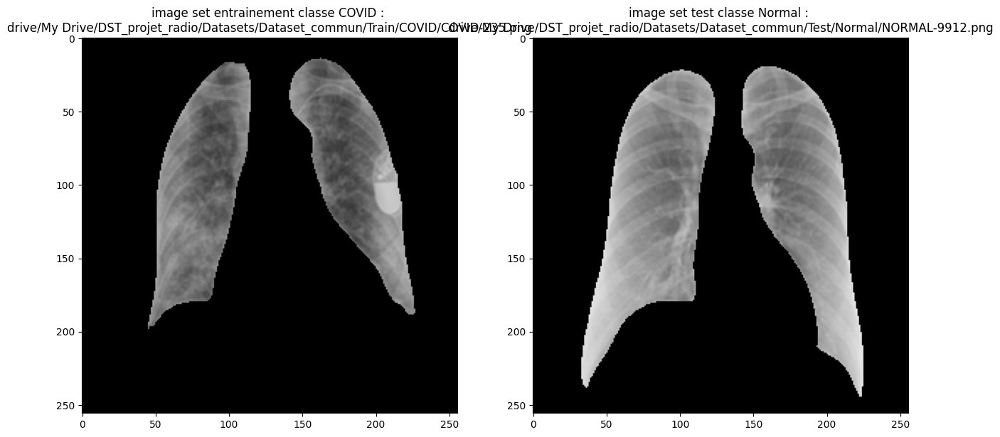

In [ ]:
# Vérification basique ouverture + affichage d'une image des sets d'images

fig, axs = plt.subplots(1,2, figsize = (15,15))

# Image du set d'entrainement
COVID = list(train_set_dir.glob('COVID/*'))
img_train_set = cv2.imread(str(COVID[0]), cv2.IMREAD_GRAYSCALE)
axs[0].imshow(img_train_set, cmap = 'gray', vmin = 0, vmax = 255)
axs[0].set_title("image set entrainement classe COVID : " + "\n" + str(COVID[0]))

# Image du set de test
Normal = list(test_set_dir.glob('Normal/*'))
img_test_set = cv2.imread(str(Normal[0]), cv2.IMREAD_GRAYSCALE)
axs[1].imshow(img_test_set, cmap = 'gray', vmin = 0, vmax = 255)
axs[1].set_title("image set test classe Normal : " + "\n" + str(Normal[0]))

plt.show()


## 3) Paramètres globaux

In [ ]:
# Définition de paramètres globaux

batch_size = 32  # valeur "standard" pour des dataset de relatives petites tailles comme sur ce projet
img_height = 256
img_width = 256
validation_split_ratio= 0.2
num_epochs = 15
keras_tuner_logs_dir = "keras_tuner/logs"

In [ ]:
# Création des sets d'entrainement et de validation au format keras
# Attention : modèles de transfer learning requièrent du RGB en input

# Création du set d'entrainement
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_set_dir,
  validation_split=validation_split_ratio,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
#  color_mode='grayscale',
  color_mode = "rgb", #pour les modèles de transfer_learning
  batch_size=batch_size,
)

# Création du set de validation
val_ds = tf.keras.utils.image_dataset_from_directory(
  train_set_dir,
  validation_split=validation_split_ratio,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
#  color_mode='grayscale',
  color_mode = "rgb", #pour les modèles de transfer_learning
  batch_size=batch_size
 )

# Création du set de test
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_set_dir,
  image_size=(img_height, img_width),
  shuffle=False, #si True, la confusion matrix est fausse
#  color_mode='grayscale',
  color_mode = "rgb", #pour les modèles de transfer_learning
 )


Found 4304 files belonging to 4 classes.
Using 3444 files for training.
Found 4304 files belonging to 4 classes.
Using 860 files for validation.
Found 1076 files belonging to 4 classes.


In [ ]:
# Vérification du découpage en classes de keras

# Set d'entrainement
train_class_names = train_ds.class_names
print("Classes détectées par KERAS dans le set d'entrainement : ", train_class_names)

# Set de validation
val_class_names = val_ds.class_names
print("Classes détectées par KERAS dans le set de validation : ", val_class_names)

# Création d'une variable globale contenant le nombre de classes
num_classes = len(train_class_names)

Classes détectées par KERAS dans le set d'entrainement :  ['COVID', 'Lung_Opacity', 'Normal', 'Viral_Pneumonia']
Classes détectées par KERAS dans le set de validation :  ['COVID', 'Lung_Opacity', 'Normal', 'Viral_Pneumonia']


## 4) Data Augmentation

In [ ]:
#Data augmentation appliquée à l'ensemble d'entraînement seulement

data_augmentation = tf.keras.Sequential([
    #Random flip : horizontal seulement
    layers.RandomFlip("horizontal"),
    #Random rotation de 10°
    layers.RandomRotation(0.1),
    #shift across heigth, weight de +- 10%
    layers.RandomTranslation(0.1, 0.1),
    #shift brightness de 10%
    layers.RandomContrast(0.1),
    layers.RandomBrightness(0.1),
    #zooming +-10%
    layers.RandomZoom(0.1)
    ])


def augment(images, label):
  return data_augmentation(images), label

train_ds = train_ds.map(augment)

## 4) Transfer learning sans tuning


### Création d'un modèle de transfer learning

In [ ]:
#Import du modèle pré-entraîné et des poids sur un jeu de données
#from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
#from keras.applications.vgg19 import VGG19, preprocess_input
#from keras.applications.vgg16 import VGG16, preprocess_input
#from keras.applications.xception import Xception, preprocess_input
#from keras.applications.resnet import ResNet50, ResNet101, preprocess_input
from keras.applications.resnet_v2 import ResNet152V2, preprocess_input
#from keras.applications.resnet_v2 import ResNet50V2, ResNet101V2, preprocess_input
#from keras.applications.mobilenet import MobileNet, preprocess_input
#from keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
#from keras.applications.densenet import DenseNet121, DenseNet201, preprocess_input
#from keras.applications.efficientnet import EfficientNetB0, EfficientNetB7, preprocess_input

#img_size_dataset = (img_height,img_width)

#Appliquer le preprocessing sur les inputs ("Note: each Keras Application expects a specific kind of input preprocessing. For VGG16, call keras.applications.vgg16.preprocess_input on your inputs before passing them to the model. vgg16.preprocess_input will convert the input images from RGB to BGR, then will zero-center each color channel with respect to the ImageNet dataset, without scaling.")
#La fonction preprocess_input est dépendante du modèle choisi (à importer avec le modèle en début de cellule)
def preprocess(images, labels):
  return preprocess_input(images), labels

train_ds_norm = train_ds.map(preprocess)
val_ds_norm = val_ds.map(preprocess)
test_ds_norm = test_ds.map(preprocess)
#Attention, le préprocess réécrit sur train_ds et val_ds, il faut donc le réimporter si on change de modèle


In [ ]:
#Création du modèle et freeze/defreeze des couches

#Création du modèle en forme fonctionnelle pour permettre l'utilisation de GradCAM


inputs = tf.keras.Input(shape=(256, 256, 3))

#base_model = VGG19(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = VGG16(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = Xception(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = ResNet50(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = ResNet101(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = ResNet50V2(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = ResNet101V2(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
base_model = ResNet152V2(input_tensor=inputs, weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = MobileNet(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = MobileNetV2(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = DenseNet121(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = DenseNet201(input_tensor=inputs, weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = EfficientNetB0(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))
#base_model = EfficientNetB7(weights= 'imagenet', include_top=False, input_shape=(256, 256, 3))

#for i, layer in enumerate(base_model.layers):
#    print(i, layer.name, layer.trainable)
#return 0

#Nécessite de créer de cette manière pour GradCam : https://discuss.tensorflow.org/t/graph-disconnected-error-in-using-gradcam/15876/3

#x = keras.layers.Resizing(img_size_model[0], img_size_model[1])(inputs)
x = base_model
x = layers.GlobalAveragePooling2D()(x.output)
x = layers.Dense(128,activation='relu')(x)
x = layers.Dense(32, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(num_classes, activation='softmax')(x)
model = keras.Model(inputs, x)
model._name = "TL_" + base_model.name



234545216/234545216 [==============================] - 3s 0us/step


In [ ]:
#Finetuning du modèle si paramétré
#1er entraînement : freezer toutes les couches du modèle de base
#fine_tune = 0

# 2è entraînement :
  # 0 = : toutes les couches du modèle de base sont freezées
  # >0 : nombre de couches à defreezer à la fin du modèle de base

fine_tune = len(base_model.layers)//2

base_model.trainable = True
if fine_tune > 0:
    for layer in base_model.layers[:-fine_tune]:
        layer.trainable = False
else:
    base_model.trainable = False

#3è entraînement : dé-freezer l'intégralité du modèle de base
#base_model.trainable = True


#Afficher les couches entraînables (True = non gelées)
for layer in model.layers:
  print(layer.name, "_Trainable : ", layer.trainable)


input_1 _Trainable :  False
conv1_pad _Trainable :  False
conv1_conv _Trainable :  False
pool1_pad _Trainable :  False
pool1_pool _Trainable :  False
conv2_block1_preact_bn _Trainable :  False
conv2_block1_preact_relu _Trainable :  False
conv2_block1_1_conv _Trainable :  False
conv2_block1_1_bn _Trainable :  False
conv2_block1_1_relu _Trainable :  False
conv2_block1_2_pad _Trainable :  False
conv2_block1_2_conv _Trainable :  False
conv2_block1_2_bn _Trainable :  False
conv2_block1_2_relu _Trainable :  False
conv2_block1_0_conv _Trainable :  False
conv2_block1_3_conv _Trainable :  False
conv2_block1_out _Trainable :  False
conv2_block2_preact_bn _Trainable :  False
conv2_block2_preact_relu _Trainable :  False
conv2_block2_1_conv _Trainable :  False
conv2_block2_1_bn _Trainable :  False
conv2_block2_1_relu _Trainable :  False
conv2_block2_2_pad _Trainable :  False
conv2_block2_2_conv _Trainable :  False
conv2_block2_2_bn _Trainable :  False
conv2_block2_2_relu _Trainable :  False
conv2_b

### Compilation et entraînement

In [ ]:
#Compilation :
#1è entraînement : on utilise le lr standard
#opt = Adam()
#2è entraînement : on utilise un lr plus fin
opt = Adam(learning_rate = 1e-4)

model.compile(optimizer=opt,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

#Compilation : avec fine-tuning (dégel des couches), on utilise un learning rate plus petit

model.summary()



Model: "TL_resnet152v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 130, 130, 64)         0         ['conv1_conv[0][0]']          
                                                                                     

In [ ]:
# Définition d'une callback qui stoppe le processus d'entrainement quand une valeur monitorée
# (ici la validation loss) stagne pendant un certain nombre d'epochs (et ce à partir d'un certain nombre d'epochs)

callback_early_stopping = EarlyStopping(
    monitor='val_loss',
    patience = 5,
    verbose = 1,
    restore_best_weights = True,
    start_from_epoch = 5)

#Callback ReduceLrOnPlateau
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=3, min_lr=1e-5)

#Callback LR Scheduler
def scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * 1/4

LRSched = keras.callbacks.LearningRateScheduler(scheduler, verbose=1)


In [ ]:
#Entraînement
history = model.fit(train_ds_norm,
                    validation_data=val_ds_norm,
                    epochs=20,
                    callbacks = [callback_early_stopping, keras.callbacks.TensorBoard(keras_tuner_logs_dir)])


Epoch 1/20
108/108 [==============================] - 149s 875ms/step - loss: 2.4650 - accuracy: 0.6339 - val_loss: 1.5860 - val_accuracy: 0.6651
Epoch 2/20
108/108 [==============================] - 95s 873ms/step - loss: 2.2104 - accuracy: 0.6211 - val_loss: 4.2328 - val_accuracy: 0.4174
Epoch 3/20
108/108 [==============================] - 93s 859ms/step - loss: 2.5933 - accuracy: 0.6315 - val_loss: 2.9462 - val_accuracy: 0.5895
Epoch 4/20
108/108 [==============================] - 95s 873ms/step - loss: 2.3876 - accuracy: 0.6214 - val_loss: 4.8151 - val_accuracy: 0.4849
Epoch 5/20
108/108 [==============================] - 97s 889ms/step - loss: 2.8213 - accuracy: 0.4878 - val_loss: 5.3818 - val_accuracy: 0.4221
Epoch 6/20
108/108 [==============================] - 96s 887ms/step - loss: 1.8854 - accuracy: 0.5531 - val_loss: 1.5073 - val_accuracy: 0.6256


### Evaluation des résultats

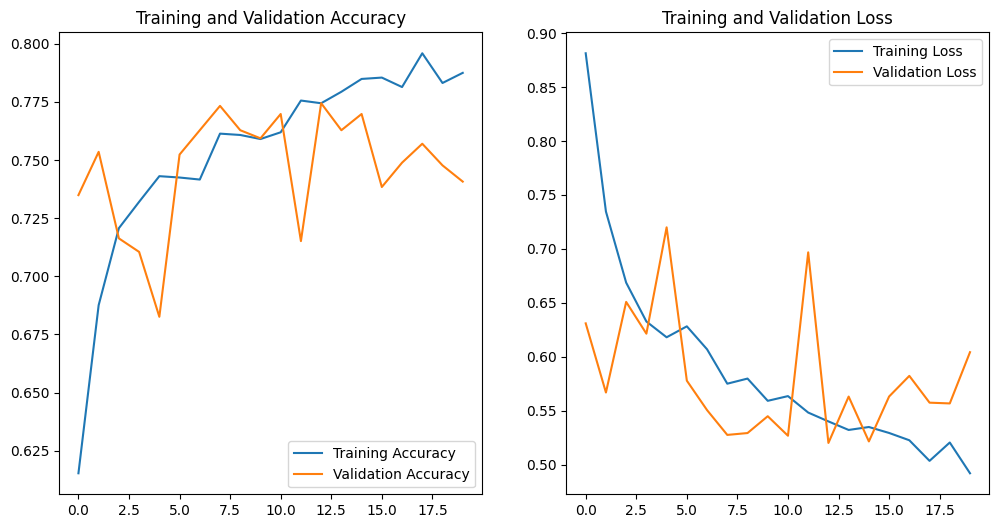

In [ ]:
#Visualize training results
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(num_epochs)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [ ]:
#Métriques sur jen d'entraînement
best_val_loss_index = np.argmin(history.history["val_loss"])
print("Best validation loss :", round(history.history["val_loss"][best_val_loss_index], 3) )
print("Validation accuracy : ", round(history.history["val_accuracy"][best_val_loss_index], 3))
print("Obtained at epoch : ", best_val_loss_index + 1)

Best validation loss : 0.52
Validation accuracy :  0.774
Obtained at epoch :  13


In [ ]:
#Métriques sur jeu de test
#model.evaluate(test_ds, return_dict=True)
model.evaluate(test_ds_norm, return_dict=True)

34/34 [==============================] - 132s 4s/step - loss: 0.6274 - accuracy: 0.7407


{'loss': 0.627384603023529, 'accuracy': 0.7407063245773315}

In [ ]:
#Performance sur le jeu de test
# Calcul d'accuracy sur le set de test
test_data = np.concatenate([x for x, y in test_ds_norm], axis=0)
test_label = np.concatenate([y for x, y in test_ds_norm], axis=0)
test_pred = model.predict(test_data)
test_pred_class = test_pred.argmax(axis = 1)
print(classification_report(test_label, test_pred_class))

34/34 [==============================] - 11s 112ms/step
              precision    recall  f1-score   support

           0       0.80      0.42      0.55       269
           1       0.73      0.69      0.71       269
           2       0.64      0.86      0.73       269
           3       0.84      1.00      0.91       269

    accuracy                           0.74      1076
   macro avg       0.75      0.74      0.73      1076
weighted avg       0.75      0.74      0.73      1076



34/34 [==============================] - 6s 170ms/step


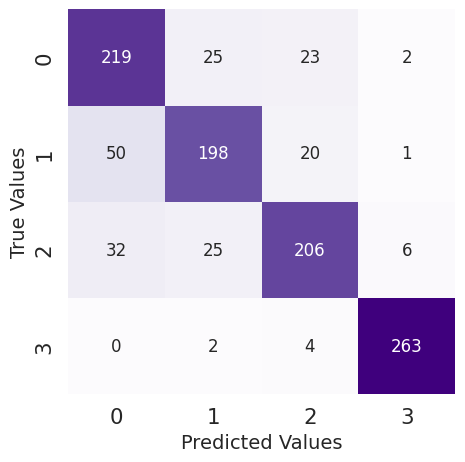

                 precision    recall  f1-score   support

          COVID       0.73      0.81      0.77       269
   Lung_Opacity       0.79      0.74      0.76       269
         Normal       0.81      0.77      0.79       269
Viral_Pneumonia       0.97      0.98      0.97       269

       accuracy                           0.82      1076
      macro avg       0.83      0.82      0.82      1076
   weighted avg       0.83      0.82      0.82      1076



In [ ]:
#Matrice de confusion

#Extraire le vecteur des vraies classes à partir de test_ds
true_classes = tf.concat([y for x, y in test_ds_norm], axis=0)
#Remplacer les valeurs par le nom des classes
true_classes = [train_class_names[i] for i in true_classes]

#Extraire le vecteur des classes prédites à partir de test_ds.
#model.predict renvoie les probabilités pour chaque classe, il faut utiliser np.argmax() pour récupérer l'id de la plus haute proba pour chaque image testée
predicted_classes = model.predict(test_ds_norm).argmax(axis = 1)
#Remplacer les valeurs par le nom des classes
predicted_classes = [train_class_names[i] for i in predicted_classes]

import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

cm = confusion_matrix(true_classes, predicted_classes)
fig = plt.figure(figsize = (5,5))
ax1 = fig.add_subplot(1,1,1)
#sns.set(font_scale=1.4) #for label size
sns.heatmap(cm, annot=True, annot_kws={"size": 12}, fmt=".0f",
     cbar = False, cmap='Purples');
ax1.set_ylabel('True Values',fontsize=14)
ax1.set_xlabel('Predicted Values',fontsize=14)
plt.show()

print(classification_report(true_classes, predicted_classes, target_names = train_class_names))

### Enregistrement du modèle et des résultats

In [ ]:
#Sauvegarde du modèle et des résultats

#Sauvegarde du modèle
best_epoch_index = np.argmin(val_loss)
nom_complet = f"{model._name}-valacc{val_acc[np.argmin(val_loss)]:.2f}-dataset{nom_dataset}-finetune{fine_tune}"

model.save(os.path.join(dossier_sauv, nom_complet + ".keras"))  # The file needs to end with the .keras extension

#Export results to dict & csv

#Dump to a pickle file
# Pickle the history to file
filepath = f"{nom_complet}_history.pkl"
filepath = os.path.join(dossier_sauv, filepath)
with open(filepath, 'wb') as f:
    pickle.dump(history, f)


# convert the history.history dict to a pandas DataFrame:
hist_df = pd.DataFrame(history.history)

# or save to csv:
hist_csv_filepath = f"{nom_complet}_history.csv"
hist_csv_filepath = os.path.join(dossier_sauv, hist_csv_filepath)
with open(hist_csv_filepath, mode='w') as f:
    hist_df.to_csv(f)

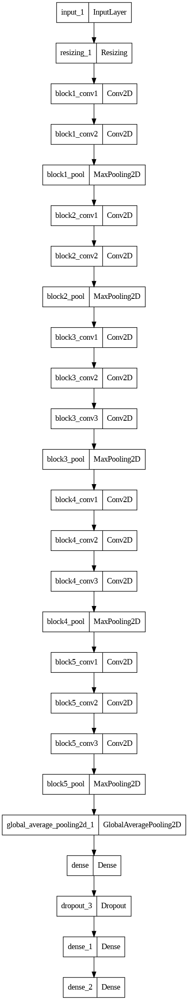

In [ ]:
#Impression du schéma
from keras.utils import plot_model
plot_model(model, to_file= 'model.png')

## 5) Optimisation des hyperparamètres (Keras tuner)

In [ ]:
# Définition de la fonction créant un modèle VGG16 et ses hyperparamètres

hp = keras_tuner.HyperParameters()

base_model = VGG16(weights= 'imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False

def build_model(hp):

  model = Sequential(name = "TL_VGG16_tuning")
  #data_augmentation,

  # RESIZE TO 224*224
  model.add(layers.Resizing(img_size_model[0], img_size_model[1]))

  #VGG16
  model.add(base_model),

  # POOLING
  model.add(layers.GlobalAveragePooling2D())

  # DROPOUT 1
  # HYPERPARAMETRAGE POURCENTAGE
  model.add(layers.Dropout(hp.Float('dropout1', 0, 0.5, step=0.1)))

  # DENSE 1
  # HYPERPARAMETRAGE NOMBRE NEURONES
  model.add(layers.Dense(units = hp.Choice("units_1", [0, 32, 64, 128, 256, 512]),
               activation = 'tanh', name = "Dense1"))

  # DROPOUT 2
  # HYPERPARAMETRAGE POURCENTAGE
  model.add(layers.Dropout(hp.Float('dropout2', 0, 0.5, step=0.1)))

  # DENSE 2
  # HYPERPARAMETRAGE NOMBRE NEURONES
  model.add(layers.Dense(units = hp.Choice("units_2", [0, 32, 64, 128, 256, 512]),
               activation = 'tanh', name = "Dense2"))


  # DROPOUT 2
  # HYPERPARAMETRAGE POURCENTAGE
  model.add(layers.Dropout(hp.Float('dropout2', 0, 0.5, step=0.1)))

  # DENSE FINAL
  model.add(layers.Dense(units = num_classes,
              activation = 'softmax',
               name = "Dense_final"))

  # LEARNING RATE
  # HYPERPARAMETRAGE VALEUR
  lr = hp.Choice("learning_rate", values=[1e-1, 1e-2, 1e-3, 1e-4, 1e-5])
  opt = Adam(learning_rate=lr)

  # COMPILATION DU MODELE
  model.compile(optimizer=opt,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

  return model


58889256/58889256 [==============================] - 2s 0us/step


In [ ]:
# Instanciation de l'objet keras tuner de type Hyperband

tuner = Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs = num_epochs,
    hyperband_iterations = 1,
    overwrite = True, # on écrase les données générées précédentes à chaque éxecution
    directory="keras_tuner",
    project_name="results",
    seed=42
)

# Affichage du résumé des hyperparamètres à tuner
tuner.search_space_summary()

Search space summary
Default search space size: 5
dropout1 (Float)
{'default': 0.0, 'conditions': [], 'min_value': 0.0, 'max_value': 0.5, 'step': 0.1, 'sampling': 'linear'}
units_1 (Choice)
{'default': 0, 'conditions': [], 'values': [0, 32, 64, 128, 256, 512], 'ordered': True}
dropout2 (Float)
{'default': 0.0, 'conditions': [], 'min_value': 0.0, 'max_value': 0.5, 'step': 0.1, 'sampling': 'linear'}
units_2 (Choice)
{'default': 0, 'conditions': [], 'values': [0, 32, 64, 128, 256, 512], 'ordered': True}
learning_rate (Choice)
{'default': 0.1, 'conditions': [], 'values': [0.1, 0.01, 0.001, 0.0001, 1e-05], 'ordered': True}


In [ ]:
# Définition d'une callback qui stoppe le processus d'entrainement quand une valeur monitorée
# (ici la validation loss) stagne pendant un certain nombre d'epochs (et ce à partir d'un certain nombre d'epochs)

callback_early_stopping = EarlyStopping(monitor='val_loss',
    patience = 5,
    verbose = 1,
    restore_best_weights = True,
    start_from_epoch = 3)

In [ ]:
# Recherche par le keras tuner des meilleurs hyperparamètres du modèle

tuner.search(train_ds,
             validation_data=val_ds,
             epochs=num_epochs,
             callbacks = [callback_early_stopping, keras.callbacks.TensorBoard(keras_tuner_logs_dir)])


Trial 30 Complete [00h 08m 23s]
val_accuracy: 0.7872093319892883

Best val_accuracy So Far: 0.8511627912521362
Total elapsed time: 01h 42m 44s


In [ ]:
# Affichage du résumé des résultats du keras tuner

tuner.results_summary()

Results summary
Results in keras_tuner/results
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 0016 summary
Hyperparameters:
dropout1: 0.0
units_1: 128
dropout2: 0.1
units_2: 32
learning_rate: 0.001
tuner/epochs: 15
tuner/initial_epoch: 5
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 0013
Score: 0.8511627912521362

Trial 0027 summary
Hyperparameters:
dropout1: 0.0
units_1: 32
dropout2: 0.0
units_2: 256
learning_rate: 0.001
tuner/epochs: 15
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.8453488349914551

Trial 0017 summary
Hyperparameters:
dropout1: 0.30000000000000004
units_1: 256
dropout2: 0.0
units_2: 32
learning_rate: 0.001
tuner/epochs: 15
tuner/initial_epoch: 5
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 0012
Score: 0.8406976461410522

Trial 0024 summary
Hyperparameters:
dropout1: 0.0
units_1: 512
dropout2: 0.4
units_2: 512
learning_rate: 0.0001
tuner/epochs: 15
tuner/initial_epoch: 5
tuner/bracket: 1
tuner/round: 1
tuner/trial_

Meilleurs modèles :
- 1 seul dropout
- 2 couches de neurones denses (ex : 128, 32)
- learning rate 0.001 ou 0.0001

In [ ]:
# Zip et sauvegarde sur google drive des résultats et logs du keras tuner

dossier_logs = os.path.join(dossier_sauv, "keras_tuner.zip")
#!zip -r '/content/drive/MyDrive/Perso/projet_radio/keras_tuner.zip' 'keras_tuner'
!zip -r dossier_logs 'keras_tuner'

  adding: keras_tuner/ (stored 0%)
  adding: keras_tuner/results/ (stored 0%)
  adding: keras_tuner/results/trial_0012/ (stored 0%)
  adding: keras_tuner/results/trial_0012/trial.json (deflated 68%)
  adding: keras_tuner/results/trial_0012/checkpoint (deflated 48%)
  adding: keras_tuner/results/trial_0012/checkpoint.index (deflated 67%)
  adding: keras_tuner/results/trial_0012/checkpoint.data-00000-of-00001 (deflated 7%)
  adding: keras_tuner/results/trial_0017/ (stored 0%)
  adding: keras_tuner/results/trial_0017/trial.json (deflated 68%)
  adding: keras_tuner/results/trial_0017/checkpoint (deflated 48%)
  adding: keras_tuner/results/trial_0017/checkpoint.index (deflated 67%)
  adding: keras_tuner/results/trial_0017/checkpoint.data-00000-of-00001 (deflated 7%)
  adding: keras_tuner/results/trial_0019/ (stored 0%)
  adding: keras_tuner/results/trial_0019/trial.json (deflated 68%)
  adding: keras_tuner/results/trial_0019/checkpoint (deflated 48%)
  adding: keras_tuner/results/trial_0019

In [ ]:
# Sauvegarde (sur google drive) du meilleur modèle sorti du keras tuner

best_model = tuner.get_best_models(num_models=1)[0]

nom_complet = f"{best_model._name}_tuned"

#best_model.save('/content/drive/MyDrive/Perso/projet_radio/best_model_keras_tuner.keras')
best_model.save(os.path.join(dossier_sauv, nom_complet + ".keras"))  # The file needs to end with the .keras extension


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_api.py:164: UserWarning: You are saving a model that has not yet been built. It might not contain any weights yet. Consider building the model first by calling it on some data.
  saving_lib.save_model(model, filepath)


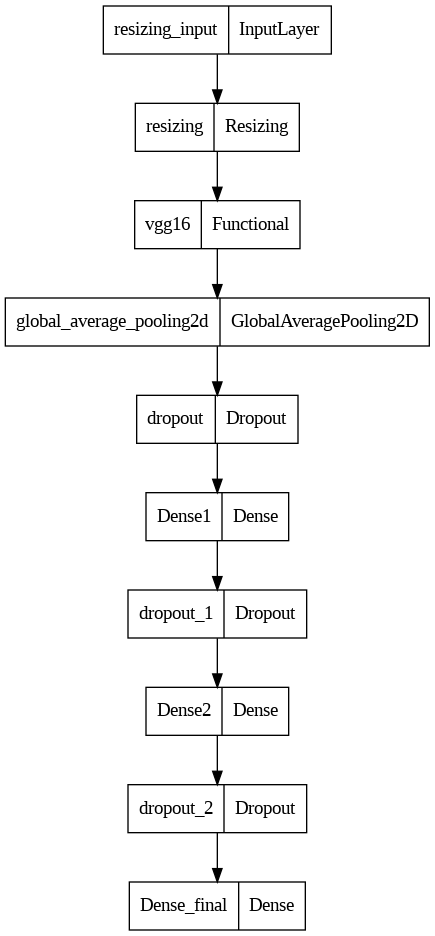

In [ ]:
#Impression du schéma
from keras.utils import plot_model
plot_model(best_model, to_file= 'best_model.png')

In [ ]:
# Visualisation des résultats intermédiaires de tuning via Tensor Board

# SOIT le tuning a déjà été fait et ses résultats sont stockés sur le drive
# --> on dézippe le contenu stocké sur le drive dans l'environnement du notebook
# --> ligne non commentée
# SOIT le tuning vient d'être fait et ses résultats sont dans l'environnement du notebook
# --> ligne commentée
#!unzip '/content/drive/MyDrive/Perso/projet_radio/keras_tuner.zip'

%load_ext tensorboard
%tensorboard --logdir 'keras_tuner/logs'

<IPython.core.display.Javascript object>

## 7) Interprétabilité Grad-CAM

In [ ]:
#Import du modèle : à n'utiliser que si le modèle n'a pas tourné dans la partie supérieure du notbook
model_loaded = keras.models.load_model("/content/drive/My Drive/DST_projet_radio/Models/Kaggle_TL_vgg19-valacc0.91-datasetcommun_4304-finetune10.keras")
#charger les résultats enregistrés (pas besoin ici)
#with open("/content/drive/My Drive/DST_projet_radio/Models/LeNet-valacc0.67-dataset4000_history.pkl", 'rb') as f:
#    history = pickle.load(f)

#Importer fonctions preprocessing, si pas fait au dessus
#from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input, decode_predictions

# Show the model architecture
model_loaded.summary()

Model: "Kaggle_TL_vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)   


### Paramètres à configurer selon le modèle


In [ ]:
#Repérer la dernière couche de convolution
model.summary()

Model: "TL_resnet152v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 130, 130, 64)         0         ['conv1_conv[0][0]']          
                                                                                     

In [ ]:
#Paramètres à configurer

#Définir ici l'input shape en fonction du modèle utilisé, par exemple 224*224*3 pour VGG16
img_size = (256, 256)

#Exemple en cas de modèle importé de Keras, ne pas utiliser si on a remplacé la couche de classif
#model_builder = keras.applications.VGG16

# Make model
model = model
#si on a importé un modèle directement de Keras
#model = model_builder(weights="imagenet")
#si on a chargé un modèle avec keras.load :
#model = model_loaded

# Remove last layer's softmax. Recommandé dans l'exemple Keras mais pas nécessaire, vir ici : https://eli5.readthedocs.io/en/0.11.0/tutorials/keras-image-classifiers.html
model.layers[-1].activation = None

#Load preprocess and decode_prediction functions
#preprocess_input = keras.applications.vgg16.preprocess_input
#decode_prediction ne fonctionne que si on cherche les classes d'ImageNEt, pas besoin ici
#decode_predictions = keras.applications.vgg16.decode_predictions

#Get last_conv_layer_name with weights
last_conv_layer_name = "conv5_block3_3_conv"



### Définition des fonctions



In [ ]:
#Fonction pour charger une nouvelle image comme array pour injecter dans la fonction GradCam
def get_img_array(img_path, size):
    # `img` is a PIL image of size 256*256
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (256, 256, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 256,256, 3)
    array = np.expand_dims(array, axis=0)
    return array

In [ ]:
#Fonction grad_cam
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
def create_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = matplotlib.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    #display(Image(img_path))

    #Return superimposed_img
    return superimposed_img


### Test sur 1 image

True class :  NORMAL
Predicted class :  ['Normal']


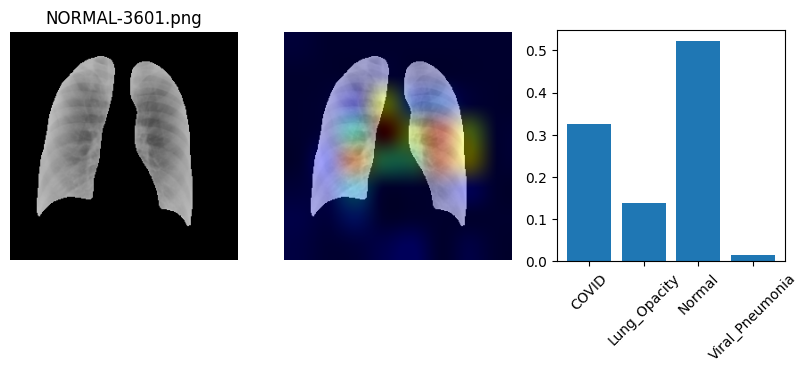

---------------------------------------------


In [ ]:
#Création de la heatmap pour l'image donnée, en utilisant la dernière couche de convolution du modèle

#Tirer une image dans le dossier. Nécessite de réappliquer la fonction de préprocessing
#à adapter selon ce qu'on veut tirer
img_set = list(test_set_dir.glob('*/*.png'))
k = int(np.random.choice(len(img_set), 1))
img_path = str(img_set[k])

#Appliquer le grad cam et afficher
def grad_cam_1img(img_path):
  img = keras.utils.load_img(img_path)

  #Récupérer le nom de l'image pour afficher la vraie classe
  img_name = str(img_path).rsplit("/",1)[1]
  real_class_name = img_name.split("-")[0]

  # Prepare image
  img_array = preprocess_input(get_img_array(img_path, size=img_size))

  # Print what the top predicted class is
  preds = model(img_array)

  #Si le modèle est chargé avec sa couche de classification, utiliser la fonction standard de Keras :
  #prediction = decode_predictions(preds, top=1)[0]

  #Sinon, le nombre de classes est différent, on calcule à la main:
  best_pred_index = tf.argmax(preds, axis = 1).numpy()
  prediction = np.array(train_class_names)[best_pred_index]


  # Generate class activation heatmap
  heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)


  #Création de la gradcam : fonctions adaptées depuis https://keras.io/examples/vision/grad_cam/
  gradcam = create_gradcam(img_path, heatmap)

  plt.figure(figsize = (10, 3))

  #Affichage de la classe réelle et prédite
  print("True class : ",real_class_name)
  #fonction pour décoder la prédiction à adapter
  print("Predicted class : ", prediction)

  #Affichage de l'image source
  plt.subplot(131)
  plt.imshow(img, cmap = "gray")
  plt.title(img_name)
  plt.axis("off")

  #AFfichage de la grad-cam
  plt.subplot(132)
  plt.imshow(gradcam)
  plt.axis("off")

  #Affichage du graphique des probabilités
  plt.subplot(133)
  #On réapplique la fonction softmax pour obtenir les probabilités, car on avait désactivé la couche d'activation
  plt.bar(train_class_names, np.squeeze(tf.nn.softmax(preds).numpy()))
  plt.xticks(rotation = 45)

  plt.show()
  print("---------------------------------------------")

#Appliquer la fonction à l'image sélectionnée
grad_cam_1img(img_path)


True class :  COVID
Predicted class :  ['COVID']


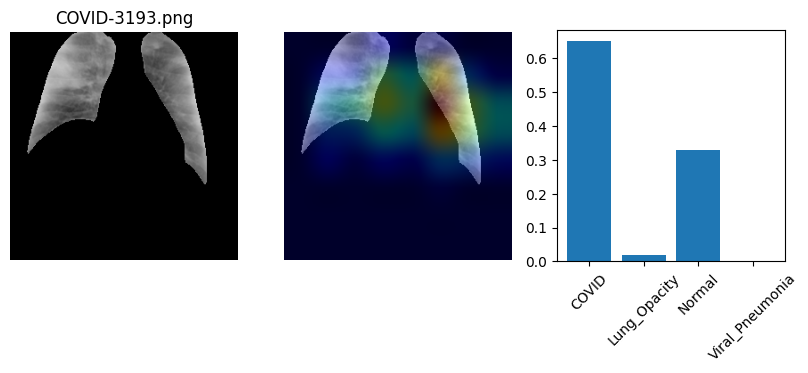

---------------------------------------------
True class :  COVID
Predicted class :  ['COVID']


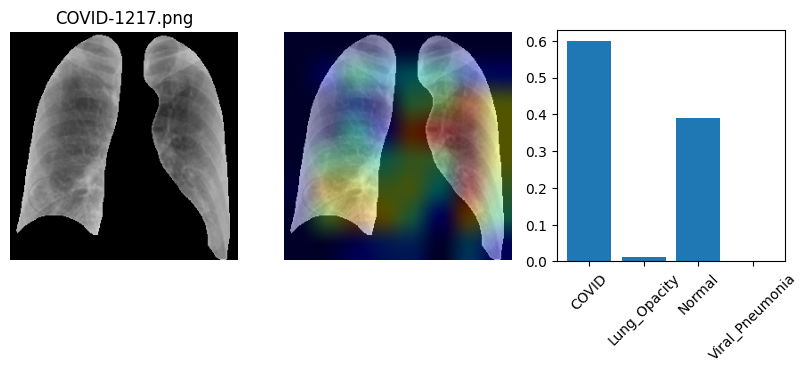

---------------------------------------------
True class :  COVID
Predicted class :  ['COVID']


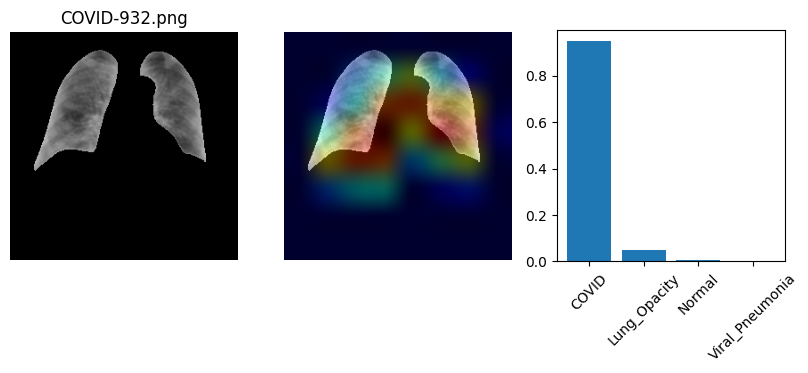

---------------------------------------------
True class :  Lung_Opacity
Predicted class :  ['Normal']


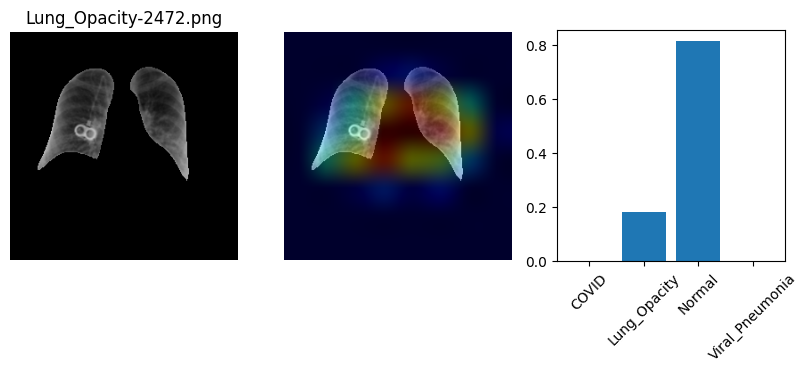

---------------------------------------------
True class :  Lung_Opacity
Predicted class :  ['Normal']


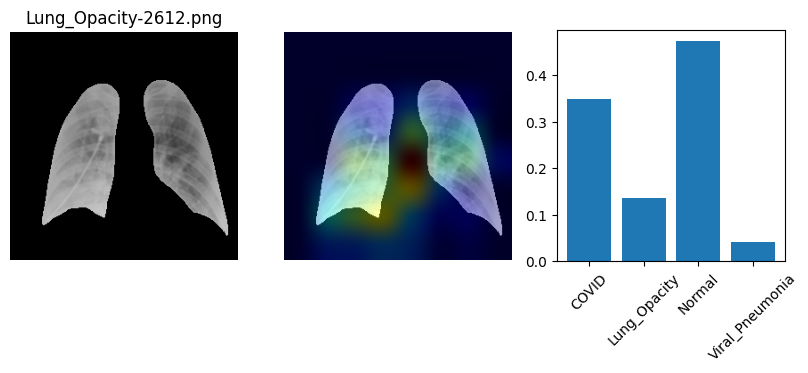

---------------------------------------------
True class :  Lung_Opacity
Predicted class :  ['Viral_Pneumonia']


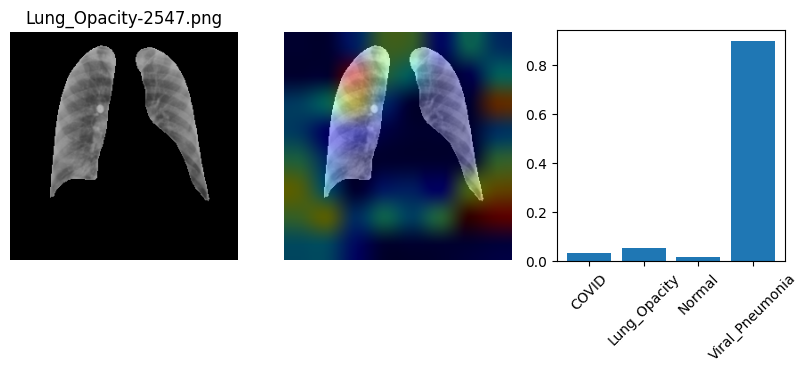

---------------------------------------------
True class :  NORMAL
Predicted class :  ['Normal']


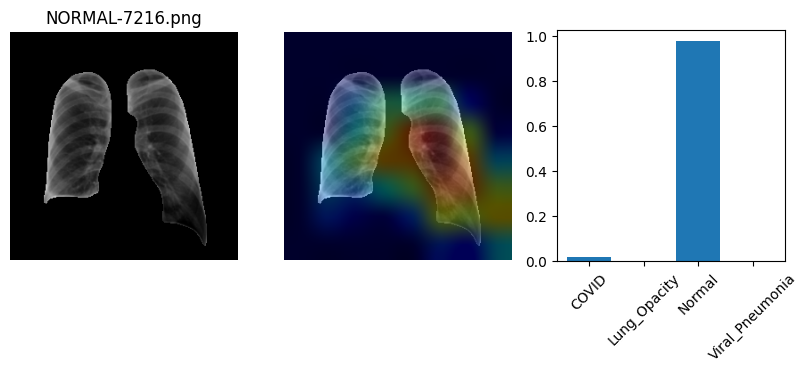

---------------------------------------------
True class :  NORMAL
Predicted class :  ['Normal']


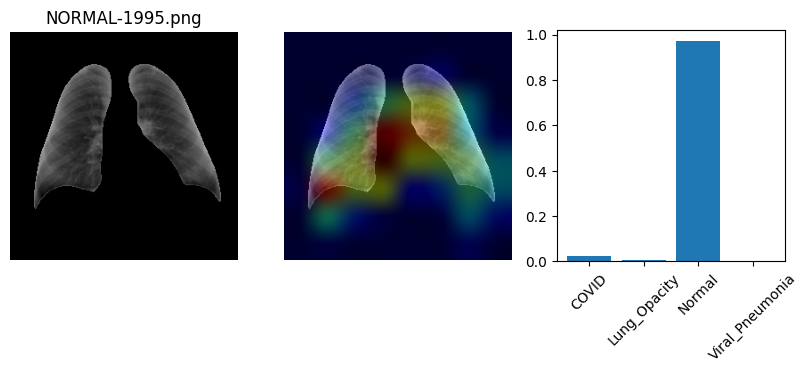

---------------------------------------------
True class :  NORMAL
Predicted class :  ['Normal']


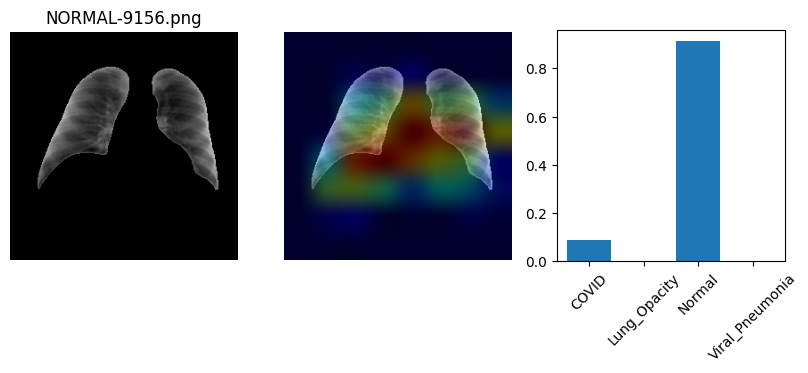

---------------------------------------------
True class :  Viral Pneumonia
Predicted class :  ['Viral_Pneumonia']


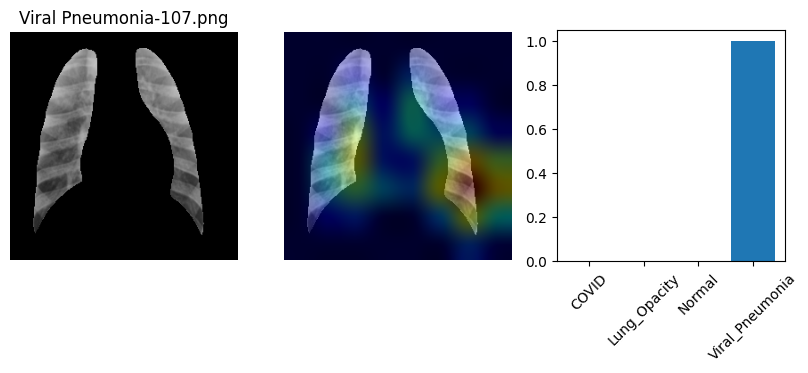

---------------------------------------------
True class :  Viral Pneumonia
Predicted class :  ['Viral_Pneumonia']


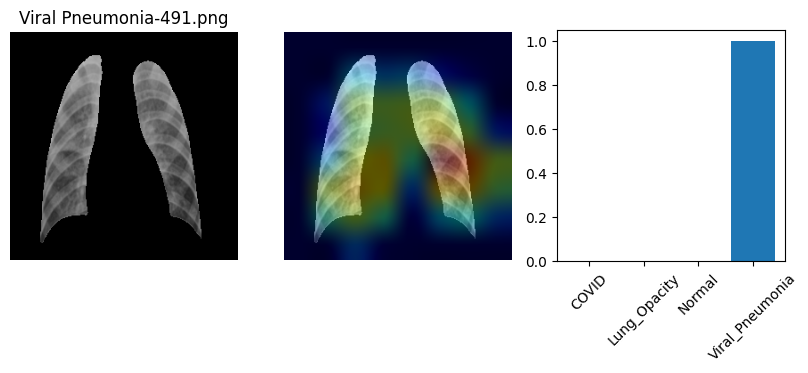

---------------------------------------------
True class :  Viral Pneumonia
Predicted class :  ['Viral_Pneumonia']


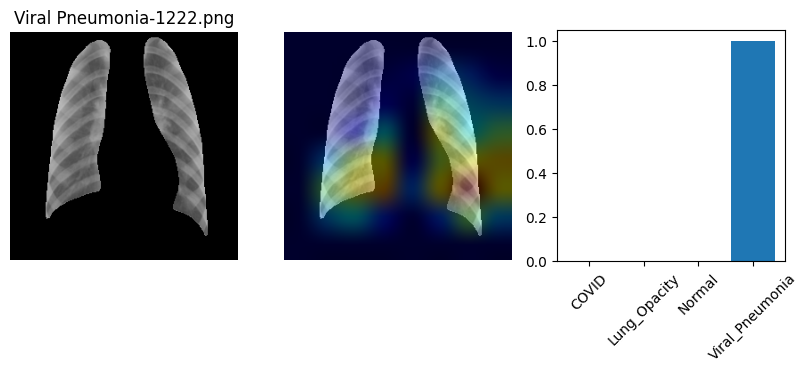

---------------------------------------------


In [ ]:
#Tirer plusieurs images de la même classe pour détecter des features communes

#Itérer sur les 4 classes
for c in train_class_names:
  #Pointer vers le dossier de la classe dans le set de test
  img_set_class = list(test_set_dir.glob(c+'/*.png'))
  #Tirer 3 entiers au hasard dans la limite du nombre d'images du dossier
  #Itérer sur la fonction et afficher
  for k in np.random.choice(len(img_set_class), 3):
    #Extraire le chemin de l'image
    img_path = str(img_set_class[k])
    #Afficher le grad cam avec la fonction construire plus haut
    grad_cam_1img(img_path)


### Analyse des erreurs de classification

Analyse des erreurs de classification
True class :  Normal
Predicted class :  Lung_Opacity


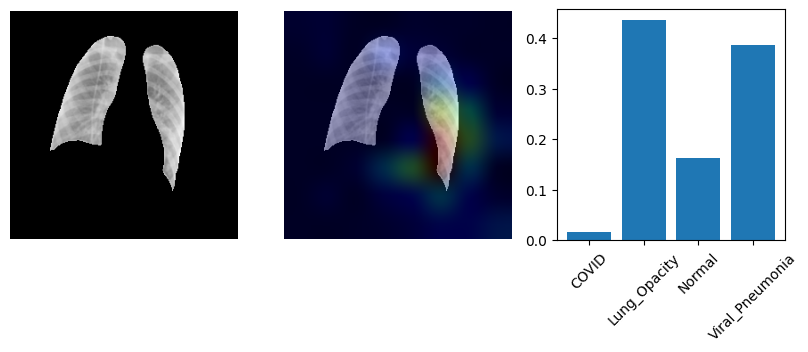

In [ ]:
#Analyse des erreurs de classification

#Récupérer les id des images en erreur dans le test_ds
id_imgs_errors = np.where((test_label != test_pred_class))

#On tire une image au hasard dans celles qui ont été mal classées
random_id = np.random.choice(id_imgs_errors[0])
img_error_array = test_data[random_id]

#Ajout d'une dimension pour simuler le batch size à 1
img_error_array = np.expand_dims(img_error_array, axis=0)

#Fonction grad-CAM adaptée qui prend en input une image du dataset pré-importé et préprocessé dans Keras
#Préprocessing déjà appliqué sur test_ds_norm

# Print what the top predicted class is
preds = model(img_error_array)

#Si le modèle est chargé avec sa couche de classification, utiliser la fonction standard de Keras :
#prediction = decode_predictions(preds, top=1)[0]

#Sinon, le nombre de classes est différent, on calcule à la main:
best_pred_index = tf.argmax(preds, axis = 1).numpy()
prediction = np.array(train_class_names)[best_pred_index]

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_error_array, model, last_conv_layer_name)

#### Création de la gradcam : Extrait de la fonction définie au dessus pour pouvoir utiliser avec un array
alpha = 0.4

# L'array "img_error_array" a été transformé pour l'input du modèle. Il faut le reconvertir en image.
# Recentrer entre [0,1] et réduire la dimension de l'image array pour entrer dans la fonction ci-dessous
img_error_array = np.squeeze(img_error_array)
img_error_array = cv2.normalize(img_error_array, None, alpha = 0, beta = 1, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)

# Rescale heatmap to a range 0-255
heatmap = np.uint8(255 * heatmap)
# Use jet colormap to colorize heatmap
jet = matplotlib.colormaps["jet"]
# Use RGB values of the colormap
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]
# Create an image with RGB colorized heatmap
jet_heatmap = keras.utils.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img_error_array.shape[1], img_error_array.shape[0]))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)
# Superimpose the heatmap on original image
superimposed_img = jet_heatmap * alpha + img_error_array*255
superimposed_img = keras.utils.array_to_img(superimposed_img)


### On affiche tout ça dans un joli subplot : l'image, la grad Cam, les probabilités en sortie du modèle
plt.figure(figsize = (10, 3))

#Affichage de la classe réelle et prédite
print("Analyse des erreurs de classification")
print("True class : ",train_class_names[test_label[random_id]])
#fonction pour décoder la prédiction à adapter
print("Predicted class : ", train_class_names[test_pred_class[random_id]])

#Affichage de l'image source
plt.subplot(131)
plt.imshow(img_error_array, cmap='gray', vmin=0, vmax=255)
plt.axis("off")

#AFfichage de la grad-cam
plt.subplot(132)
plt.imshow(superimposed_img)
plt.axis("off")

#Affichage du graphique des probabilités
plt.subplot(133)
#On réapplique la fonction softmax pour obtenir les probabilités, car on avait désactivé la couche d'activation
plt.bar(train_class_names, np.squeeze(tf.nn.softmax(preds).numpy()))
plt.xticks(rotation = 45)

plt.show()

## Voting ensemble : pas réussi, nécessite de réappliquer le processing dédié à chaque modèle...

In [ ]:
#Load models
model_1 = keras.models.load_model("/content/drive/My Drive/DST_projet_radio/Models/Kaggle_TL_vgg19-valacc0.91-datasetcommun_4304-finetune10.keras")
model_2 = keras.models.load_model("/content/drive/My Drive/DST_projet_radio/Models/TL_densenet201-valacc0.89-datasetcommun_4304-finetune0.keras")
model_3 = keras.models.load_model("/content/drive/My Drive/DST_projet_radio/Models/TL_resnet152v2-valacc0.87-datasetcommun_4304-finetune564.keras")
models = [model_1, model_2, model_3]

In [ ]:
#Appliquer les fonctions de préprocessing à l'ensemble de test
from keras.applications.vgg19 import preprocess_input as preprocess_vgg19
#from keras.applications.vgg16 import VGG16, preprocess_input
#from keras.applications.xception import Xception, preprocess_input
#from keras.applications.resnet import ResNet50, ResNet101, preprocess_input
from keras.applications.resnet_v2 import preprocess_input as preprocess_resnetV2
#from keras.applications.resnet_v2 import ResNet50V2, ResNet101V2, preprocess_input
#from keras.applications.mobilenet import MobileNet, preprocess_input
#from keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from keras.applications.densenet import preprocess_input as preprocess_densenet
#from keras.applications.efficientnet import EfficientNetB0, EfficientNetB7, preprocess_input

#Appliquer le preprocessing sur les inputs ("Note: each Keras Application expects a specific kind of input preprocessing. For VGG16, call keras.applications.vgg16.preprocess_input on your inputs before passing them to the model. vgg16.preprocess_input will convert the input images from RGB to BGR, then will zero-center each color channel with respect to the ImageNet dataset, without scaling.")
def preprocess(images, labels):
  return preprocess_input(images), labels


test_ds_vgg19 = test_ds.map(lambda images, labels : preprocess_vgg19(images), labels)
#test_ds_resnetV2 = test_ds.map(preprocess_resnetV2)
#test_ds_densenet = test_ds.map(preprocess_densenet)

NameError: ignored

In [ ]:
model_1.evaluate(test_ds_vgg19, return_dict=True)

34/34 [==============================] - 6s 177ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00


{'loss': 0.0, 'accuracy': 0.0}

In [ ]:
import scipy
# Predict labels with each models and store it in an array
pred_labels = []
for m in models:
    predicts = np.argmax(m.predict(test_data), axis=1)
    pred_labels.append(predicts)

# Ensemble with voting
pred_labels = np.array(pred_labels)

34/34 [==============================] - 4s 98ms/step


In [ ]:
model_1.evaluate(test_ds_norm, return_dict=True)

34/34 [==============================] - 3s 79ms/step - loss: 1.5098 - accuracy: 0.3030


{'loss': 1.5098201036453247, 'accuracy': 0.30297398567199707}

In [ ]:
pred_labels_mode = scipy.stats.mode(pred_labels, axis=-1)[0]
pred_labels_mode

array([2, 1, 1])

In [ ]:
pred_labels = np.transpose(pred_labels, (1, 0))
pred_labels = scipy.stats.mode(pred_labels, axis=-1)[0]
pred_labels = np.squeeze(pred_labels)

#Evaluate
print("Rapport de classification du vote entre les 3 modèles")
print(classification_report(test_label, pred_labels))